<a href="https://colab.research.google.com/github/praveenwork/ml/blob/main/Practice/Dogs_Cats.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"praveenpasupuleti","key":"73a5e607fb9aaae7a749a6f2928fc89f"}'}

In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp kaggle.json ~/.kaggle/

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json 

In [ ]:
!kaggle dataset list

usage: kaggle [-h] [-v] {competitions,c,datasets,d,kernels,k,config} ...
kaggle: error: argument command: invalid choice: 'dataset' (choose from 'competitions', 'c', 'datasets', 'd', 'kernels', 'k', 'config')


In [ ]:
!kaggle competitions download -c 'dogs-vs-cats'

 97% 264M/271M [00:03<00:00, 110MB/s]
100% 271M/271M [00:03<00:00, 90.5MB/s]
  0% 0.00/86.8k [00:00<?, ?B/s]
100% 86.8k/86.8k [00:00<00:00, 136MB/s]
 96% 524M/543M [00:04<00:00, 110MB/s] 
100% 543M/543M [00:04<00:00, 125MB/s]


In [2]:
!wget --no-check-certificate \
   https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
   -O '/tmp/cats_and_dogs_filtered.zip'

--2021-01-27 03:00:50--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.142.128, 74.125.195.128, 142.250.107.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.142.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘/tmp/cats_and_dogs_filtered.zip’

/tmp/cats_and_dogs_ 100%[===================>]  65.43M   253MB/s    in 0.3s    

2021-01-27 03:00:50 (253 MB/s) - ‘/tmp/cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [3]:
#unzip the files

import os
import zipfile

zip_ref = zipfile.ZipFile('/tmp/cats_and_dogs_filtered.zip', 'r')
zip_ref.extractall('/tmp')
zip_ref.close()

In [4]:

import os
import zipfile

zip_ref = zipfile.ZipFile('/content/train.zip','r')
zip_ref.extractall('/content/cats_and_dogs')
zip_ref.close()

FileNotFoundError: ignored

In [ ]:
import os
import zipfile

zip_ref = zipfile.ZipFile('/content/test1.zip','r')
zip_ref.extractall('/content/cats_and_dogs')
zip_ref.close()


In [5]:
import os

base_dir = "/tmp/cats_and_dogs_filtered"

train_dir = os.path.join(base_dir, 'train')
train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')

validation_dir = os.path.join(base_dir, 'validation')
validation_cats_dir = os.path.join(validation_dir, "cats")
validation_dogs_dir = os.path.join(validation_dir, "dogs")

train_cats_names = os.listdir(train_cats_dir)
print("Total cats train images:", len(train_cats_names))

train_dogs_names = os.listdir(train_dogs_dir)
print("Total dogs train images:", len(train_dogs_names))


validation_cats_names = os.listdir(validation_cats_dir)
validation_dogs_names = os.listdir(validation_dogs_dir)

print("Total cats validation Images:", len(validation_cats_names))
print("Total dogs validation Images:", len(validation_dogs_names))




Total cats train images: 1000
Total dogs train images: 1000
Total cats validation Images: 500
Total dogs validation Images: 500


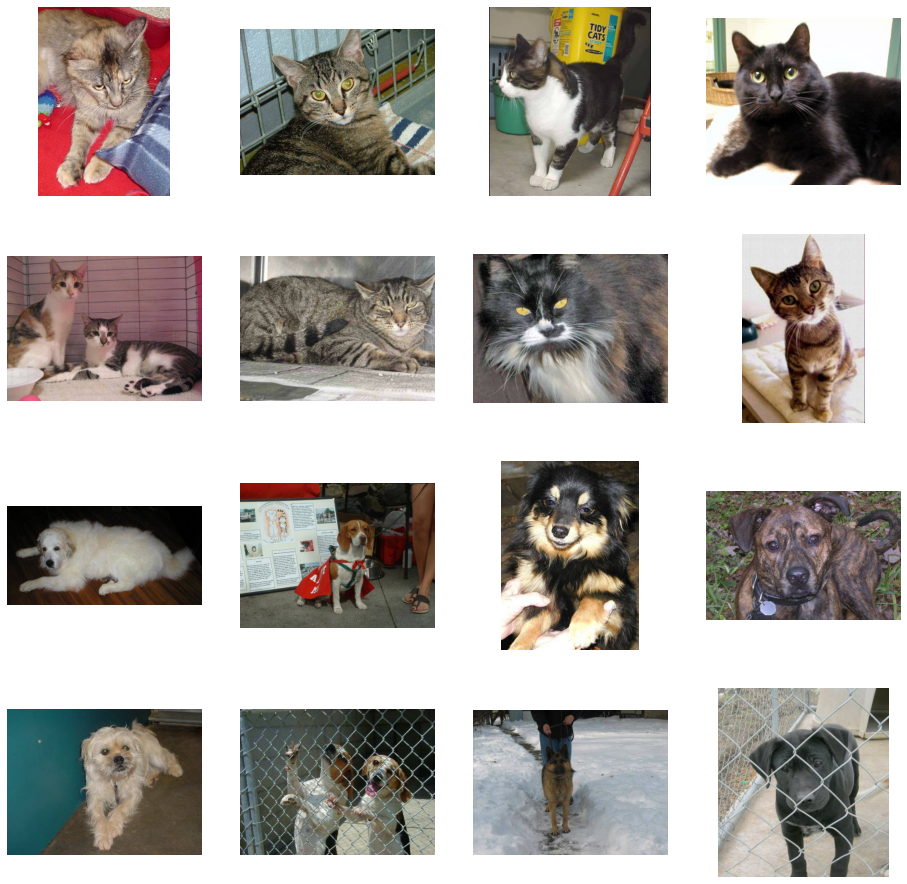

In [6]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

nrows = 4
ncols = 4

pic_index = 0

fig = plt.gcf()
fig.set_size_inches(nrows * 4, ncols *4)

pic_index += 8
next_cats_images = [os.path.join(train_cats_dir, fname) for fname in train_cats_names[pic_index-8: pic_index]]
next_dog_imgaes = [os.path.join(train_dogs_dir, fname) for fname in train_dogs_names[pic_index-8:pic_index]]

for i, img_path in enumerate(next_cats_images+next_dog_imgaes):
  sp = plt.subplot(nrows, ncols, i+1)
  sp.axis('off')

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()  

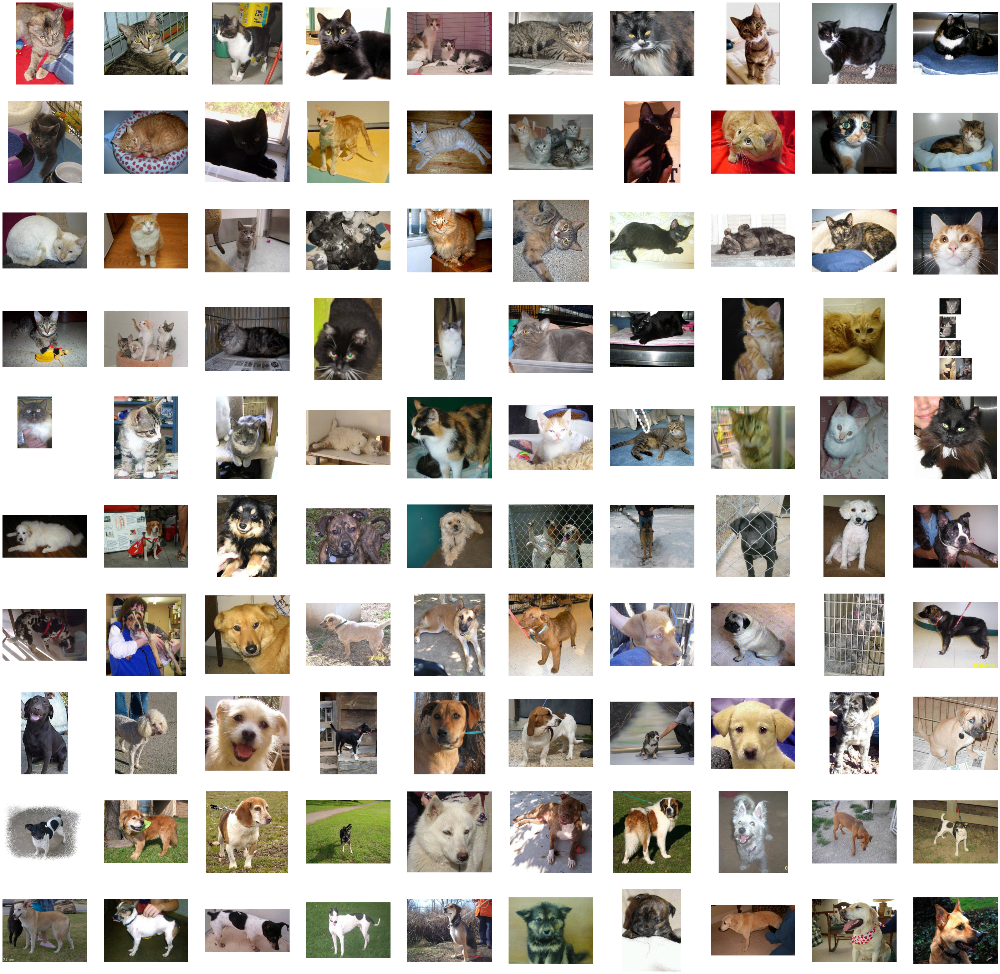

In [7]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

nrows = 10
ncols = 10

pic_index = 0


#set up fig

fig = plt.gcf()
fig.set_size_inches(nrows*5 , ncols*5)

pic_index +=50

next_cat_img = [os.path.join(train_cats_dir,fname) for fname in train_cats_names[pic_index-50:pic_index]]
next_dog_img = [os.path.join(train_dogs_dir,fname) for fname in train_dogs_names[pic_index-50:pic_index]]

for i, img_path in enumerate(next_cat_img+next_dog_img):
  sp = plt.subplot(nrows, ncols, i+1)
  sp.axis('off')
  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()




In [11]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_data_generator = ImageDataGenerator(rescale = 1./255)
train_data = train_data_generator.flow_from_directory(
      train_dir,
      target_size = (150,150),
      batch_size = 20,
      class_mode='binary'
)

validation_data_generator = ImageDataGenerator(rescale = 1./255)
validation_data = validation_data_generator.flow_from_directory(
      validation_dir,
      target_size = (150,150),
      batch_size = 20,
      class_mode = 'binary'
)


model = tf.keras.Sequential([
              tf.keras.layers.Conv2D(16, (3,3), activation= tf.nn.relu, input_shape = (150,150,3)),
              tf.keras.layers.MaxPool2D(2,2),
              tf.keras.layers.Conv2D(32, (3,3), activation= tf.nn.relu, input_shape = (150,150,3)),
              tf.keras.layers.MaxPool2D(2,2),
              tf.keras.layers.Conv2D(64, (3,3), activation= tf.nn.relu, input_shape = (150,150,3)),
              tf.keras.layers.MaxPool2D(2,2),
             

              tf.keras.layers.Flatten(),
              tf.keras.layers.Dense(512, activation= tf.nn.relu),
              tf.keras.layers.Dense(1, activation= tf.nn.sigmoid)
])

model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=0.001), loss = 'binary_crossentropy', metrics=['accuracy'])
model.summary()

history = model.fit(
    train_data,
    validation_data = validation_data,
    validation_steps = 50,
    steps_per_epoch = 100,
    epochs = 15,
    verbose = 1
)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 148, 148, 16)      448       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 74, 74, 16)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 72, 72, 32)        4640      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 36, 36, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 34, 34, 64)        18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 17, 17, 64)        0         
____________________________________

In [13]:
import numpy as np
from tensorflow.keras.preprocessing import image
from google.colab import files

uploaded = files.upload()

path = "/content/"

for fn in uploaded.keys():
  # constrcut the path
  img_path = path + fn
  # load the image with target size same size as model
  img = image.load_img(img_path,target_size =(150,150))
  # img to array
  x  = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  image = np.vstack([x])

  classes = model.predict(image, batch_size = 10)
  if classes[0]>0.5:
    print(fn, " is a dog")
  else:
    print(fn, "is a cat")


Saving cat-551554_1920.jpg to cat-551554_1920 (1).jpg
cat-551554_1920.jpg is a cat


<Figure size 432x288 with 0 Axes>

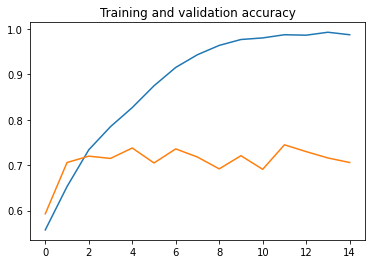

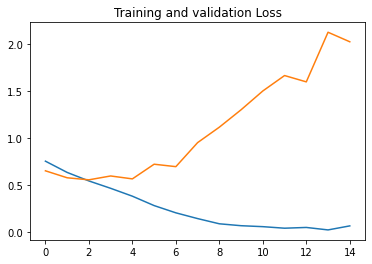

<Figure size 432x288 with 0 Axes>

In [20]:
training_loss = history.history['loss']
training_accuracy = history.history['accuracy']
validation_loss = history.history['val_loss']
validation_accuracy = history.history['val_accuracy']

epochs = range(len(training_accuracy))


#Plot training and validation accuracy

plt.plot(epochs,training_accuracy)
plt.plot(epochs, validation_accuracy)

plt.title("Training and validation accuracy")
plt.figure()

#Loss

plt.plot(epochs,training_loss)
plt.plot(epochs, validation_loss)

plt.title("Training and validation Loss")
plt.figure()
